In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader

import torchvision.transforms as transforms
import torchvision.utils
from torchvision.utils import make_grid

import torchvision.datasets

import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (10,6)

from tqdm import tqdm

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


# Introduction to Generative Adversarial Networks (GANs)

In this notebook you will build a GAN from scratch, grossly following the DCGAN architecture.

**Goals:**


1.   Build a GAN arhictecture from scratch
2.   Write the GAN loss function and train GAN from scratch
3.   Have experience with some of the instability problems inherent with training GANs.
4.   [Bonus] Extend the unconditional GAN into a conditional GAN.



## 1. Getting Started

We will work with the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset. It contains 60,000 images size 28x28 of handwritten digits, from 0 to 9.

## 1. Dataloading

### 1.1 Define some hyperparameters and transforms


In [ ]:
batch_size = 128 # Images per batch

# Resize to 32x32 for easier upsampling/downsampling
mytransform = transforms.Compose([transforms.Resize(32),
                                  transforms.ToTensor(),
                                 transforms.Normalize((.5), (.5))]) # normalize between [-1, 1] with tanh activation

mnist_train = torchvision.datasets.MNIST(root='.', download=True, transform=mytransform)

In [ ]:
dataloader = DataLoader(dataset=mnist_train,
                         batch_size=batch_size,
                         shuffle=True)

In [ ]:
# plot some images
real_batch, real_labels = next(iter(dataloader))

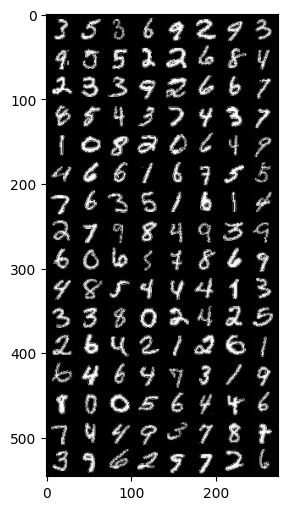

In [ ]:
plt.imshow(transforms.ToPILImage()(make_grid(real_batch)))

## 2. Model Architecture

We will follow the general architecture of a DCGAN - or deep convolutional GAN. This [influential paper](https://arxiv.org/pdf/1511.06434v2.pdf) produced much of the foundation for modern GANs and how to train them.

(GANs are notoriously **hard** to train, we will try to get a feeling why in this notebook.)


Complete the function `get_upscaling_block`. Then, use the function to define our model defined as follows:

Input: Random "noise" $z$ shaped `[n_batch, n_z]`

Output: Generated image size `[n_batch, 1, 32, 32]` in range [-1, 1]

1. Reshape z into `[n_batch, n_z, 1, 1]` to make it into an "image"
2. First upscaling block $\rightarrow$ `[n_batch, ngf*4, 4, 4]`
3. Second upscaling block $\rightarrow$ `[n_batch, ngf*2, 8, 8]`
4. Third upscaling block $\rightarrow$ `[n_batch, ngf, 16, 16]`
5. Fourth (and last) upscaling block $\rightarrow$ `[n_batch, 1, 32, 32]`

## 2.1. The Generator



The generator performs subsequent upsampling blocks, transforming a latent vector shaped [batch_size, latent_size] into an image (values in [-1, 1]).

The generator block will consists of:
- Transpose Convolution
- Batch Norm
- ReLU

In [ ]:
def get_upscaling_block(channels_in, channels_out, kernel, stride, padding, last_layer=False):
    '''
    Each transpose conv will be followed by BatchNorm and ReLU,
    except the last block (which is only followed by tanh)
    '''
    if not last_layer:
      output = nn.Sequential(
                            nn.ConvTranspose2d(channels_in, channels_out, kernel, stride, padding, bias = False),
                            nn.BatchNorm2d(channels_out),
                            nn.ReLU()
                            )
      return output


    else:
      output = nn.Sequential(
                            nn.ConvTranspose2d(channels_in, channels_out, kernel, stride, padding, bias = False),
                            nn.Tanh()
                            )
      return output




class Generator(nn.Module):
    def __init__(self, nz, ngf, nchannels=1):
        '''
        nz: The latent size (100 in our case)
        ngf: The channel-size before the last layer (32 our case)
        '''
        super().__init__()


        self.model = nn.Sequential(
                                  get_upscaling_block(nz,128,(4,4), 1, 0),
                                  get_upscaling_block(128,64,(4,4), 2, 1),
                                  get_upscaling_block(64,ngf,(4,4), 2, 1),
                                  get_upscaling_block(ngf,1,(4,4), 2, 1, last_layer=True)
        )

    def forward(self, z):
        x = z.unsqueeze(2).unsqueeze(2) # give spatial dimensions to z
        return self.model(x)


### 2.1.3. Sanity Tests

In [ ]:
nz = 1000
z = torch.randn(batch_size, nz)

In [ ]:
G = Generator(nz=nz, ngf=16, nchannels=1)
print(G(z).shape)
assert G(z).shape == (batch_size, 1, 32, 32)

G = Generator(nz=nz, ngf=16)
assert G(z).shape == (batch_size, 1, 32, 32)

torch.Size([128, 1, 32, 32])


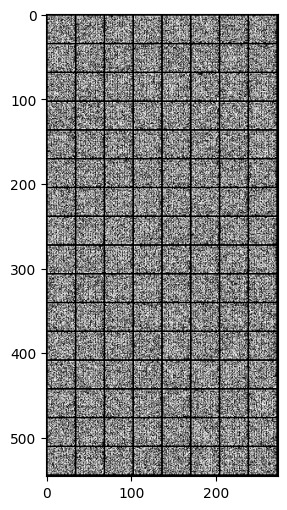

In [ ]:
# visualize the output - at first it should just look like random noise!!
x_fake = G(z)
plt.imshow(transforms.ToPILImage()(make_grid(x_fake, nrow=8)))

## 2.2. The discriminator

The discriminator will be a mirror image of the generator.

The discriminator will also use a fully convolutional architecutre, with each block consisting of:
- Conv layer
- BatchNorm
- ReLU

Complete the function `get_downscaling_block` and then use it to define the following architecture for the discriminator:

Input: Image shaped `[n_batch, 1, 32, 32]` (in [-1, 1])
Output: Discriminator scores `[n_batch, 1]` in range [0, 1]

1. First downscaling block $\rightarrow$ `[n_batch, ndf, 16, 16]`
2. Second downscaling block $\rightarrow$ `[n_batch, ndf*2, 8, 8]`
3. Third downscaling block $\rightarrow$ `[n_batch, ndf*4, 4, 4]`
4. Last downscaling block $\rightarrow$ `[n_batch, 1]`

In [ ]:
def get_downscaling_block(channels_in, channels_out, kernel, stride, padding, use_batch_norm=True, is_last=False):

    if is_last:
      output = nn.Sequential(
                      nn.Conv2d(channels_in, channels_out, kernel, stride, padding, bias = False),
                      nn.Sigmoid()
                      )
      return output

    elif not use_batch_norm:
      output = nn.Sequential(
                      nn.Conv2d(channels_in, channels_out, kernel, stride, padding, bias = False),
                      nn.LeakyReLU(0.2)
                      )
      return output

    else:
      output = nn.Sequential(
                      nn.Conv2d(channels_in, channels_out, kernel, stride, padding, bias = False),
                      nn.BatchNorm2d(channels_out),
                      nn.LeakyReLU(0.2)
                      )
      return output



class Discriminator(nn.Module):
    def __init__(self, ndf, nchannels=1):
        super().__init__()

        self.model = nn.Sequential(
                                  get_downscaling_block(1,ndf,(4,4), 2, 1),
                                  get_downscaling_block(ndf,64,(4,4), 2, 1),
                                  get_downscaling_block(64,128,(4,4), 2, 1),
                                  get_downscaling_block(128,1,(4,4), 1, 0, is_last=True)
        )

    def forward(self, x):
        return self.model(x).squeeze(1).squeeze(1) # remove spatial dimensions

### 2.2.3 Sanity Checking

In [ ]:
real_batch, real_labels = next(iter(dataloader))

In [ ]:
D = Discriminator(ndf=32, nchannels=3)
print(D(real_batch).shape)
assert D(real_batch).shape == (real_batch.shape[0], 1)

torch.Size([128, 1])


# 3. Training

## 3.1 Loss
The essential thing to remember is that the logistic and the non-saturating logistic GAN losses can be written exclusively using the [binary cross entropy loss](https://pytorch.org/docs/stable/generated/torch.nn.BCELoss.html). Our GAN loss will be defined ONLY using the following criterion:



In [ ]:
criterion = nn.BCELoss() # we will build off of this to make our final GAN loss!

## 3.2 Helper functions

We will need a few helper functions.
1. First, we need to continuously sample z from a Gaussian distribution.
2. Secondly, we need to make our "ground-truth" labels when using the BCE loss. This should output vectors of either 0s or 1s.

In [ ]:
def sample_z(batch_size, nz):
    return torch.randn(batch_size, nz, device=device)

# this is for the real ground-truth label
def get_labels_one(batch_size):
    r = torch.ones(batch_size, 1)
    return r.to(device)

# this is for the generated ground-truth label
def get_labels_zero(batch_size):
    r = torch.zeros(batch_size, 1)
    return r.to(device)


# To initialize the weights of a GAN, the DCGAN paper found that best results are obtained
# with Gaussian initialization with mean=0; std=0.02
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


# for visualization
to_pil = transforms.ToPILImage()
renorm = transforms.Normalize((-1.), (2.))

## 3.3 Creating the optimizers and hyperparameters

The original DCGAN paper shows that Adam works well in the generator and the discriminator with a learning rate of 0.0002 and Beta1 = 0.5.

Define your optimizers

In [ ]:
nz = 100
ngf = 32
ndf = 32

nchannels= 1
lr_d = 0.0002
lr_g = 0.0005
beta1= 0.5
display_freq = 200

netD = Discriminator(ndf, nchannels).to(device)
netG = Generator(nz, ngf).to(device)

netD.apply(weights_init)
netG.apply(weights_init)

g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))


In [ ]:
netG

Generator(
  (model): Sequential(
    (0): Sequential(
      (0): ConvTranspose2d(100, 128, kernel_size=(4, 4), stride=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (1): Sequential(
      (0): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (2): Sequential(
      (0): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (3): Sequential(
      (0): ConvTranspose2d(32, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): Tanh()
    )
  )
)

In [ ]:
netD

Discriminator(
  (model): Sequential(
    (0): Sequential(
      (0): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (3): Sequential(
      (0): Conv2d(128, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
      (1): Sigmoid()
    )
  )
)

## 3.3 Training!

Now for the fun part, training!
Training a GAN consists in making an update to the discriminator, then the generator.
Training a GAN requires BABYSITTING!! Remember that many things can go wrong when training a GAN:
- The discriminator is too strong for the generator - the generator cannot improve.
- The generator easily fools the discriminator - cannot learn.
- Mode collapse - generator is not capable of generating diverse images.

it: 0; g_loss: 0.8719145655632019; d_loss: 1.5257190465927124; avg_real_score: 0.5863771438598633; avg_fake_score: 0.5961700081825256: : 0it [00:02, ?it/s]

generated images


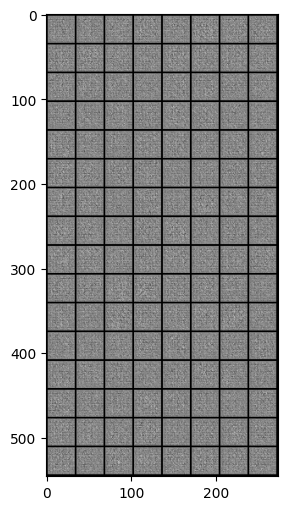

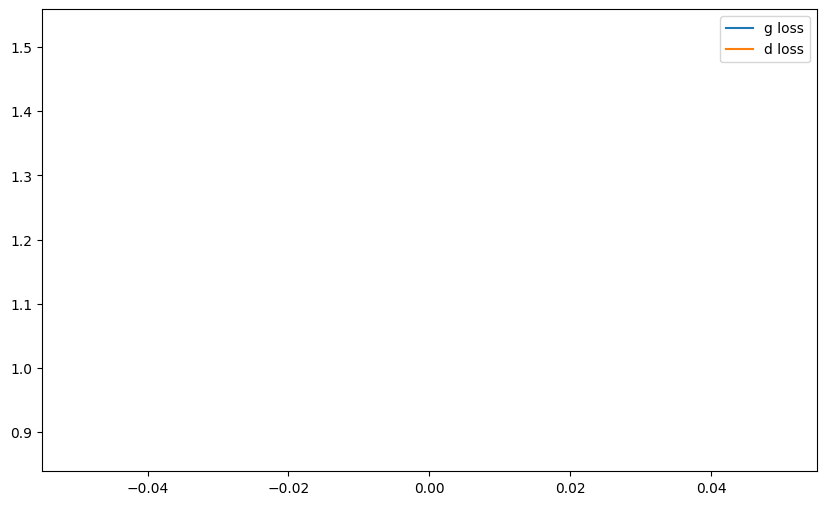

it: 200; g_loss: 1.733201265335083; d_loss: 0.6461383104324341; avg_real_score: 0.7344103455543518; avg_fake_score: 0.2633011043071747: : 200it [00:18, 17.65it/s] 

generated images


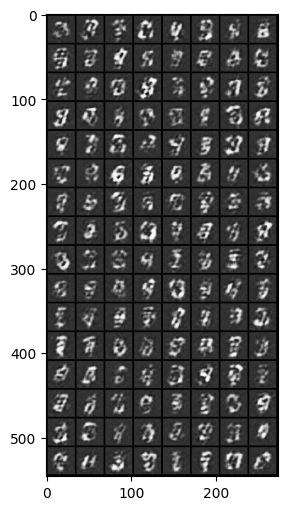

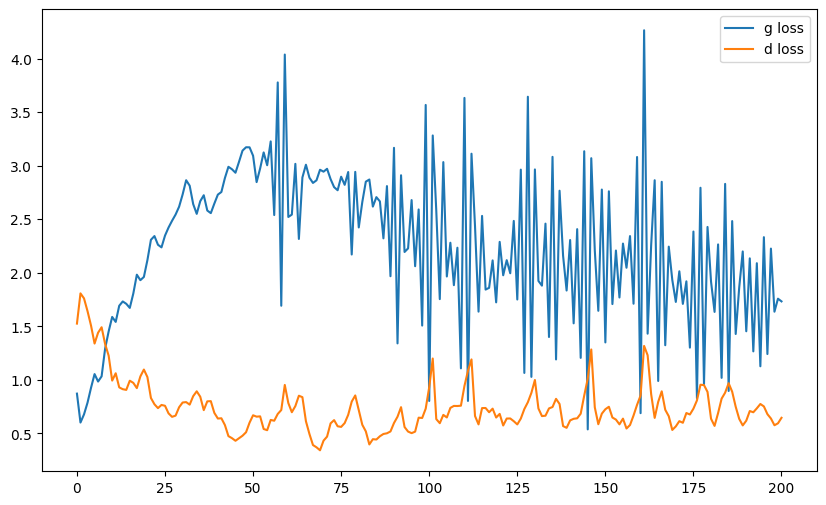

it: 400; g_loss: 1.7673356533050537; d_loss: 0.6477416753768921; avg_real_score: 0.7491630911827087; avg_fake_score: 0.28081411123275757: : 400it [00:31, 16.45it/s]

generated images


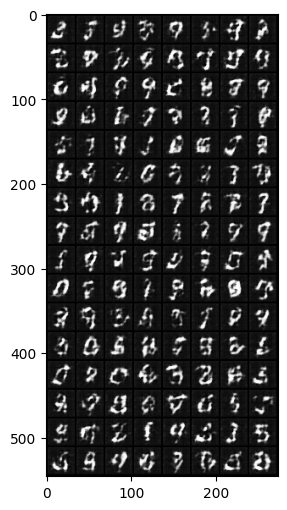

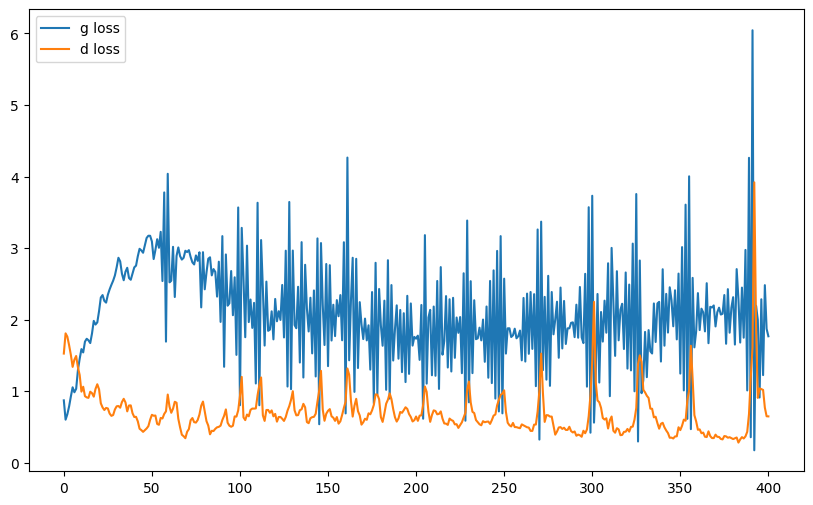

it: 468; g_loss: 1.9120161533355713; d_loss: 0.6483798027038574; avg_real_score: 0.8005301356315613; avg_fake_score: 0.3263293206691742: : 469it [00:37, 12.67it/s]
it: 469; g_loss: 1.8646588325500488; d_loss: 0.6364264488220215; avg_real_score: 0.7387998700141907; avg_fake_score: 0.26439517736434937: : 0it [00:00, ?it/s]

generated images


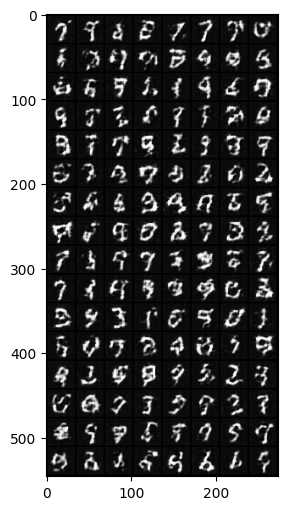

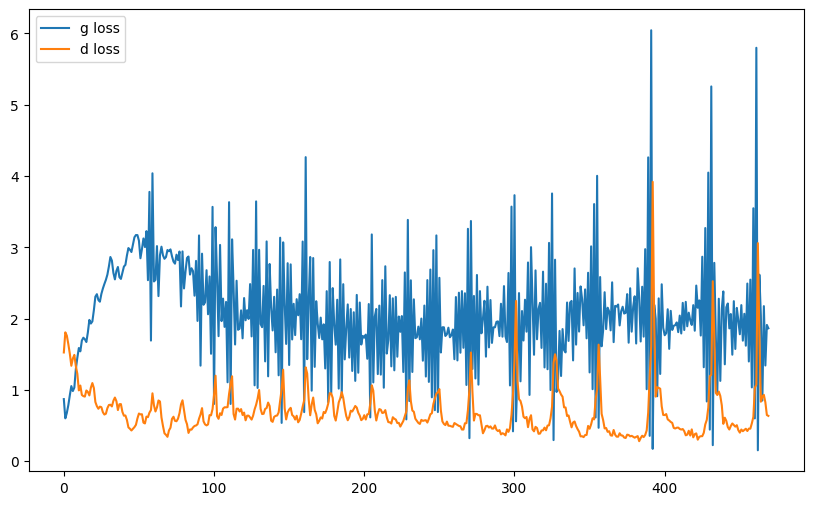

it: 669; g_loss: 1.1276237964630127; d_loss: 0.8871718645095825; avg_real_score: 0.6033205986022949; avg_fake_score: 0.28575628995895386: : 199it [00:14, 13.89it/s]

generated images


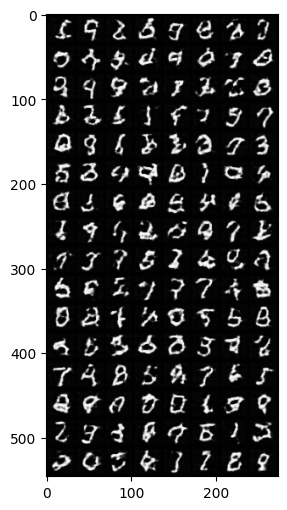

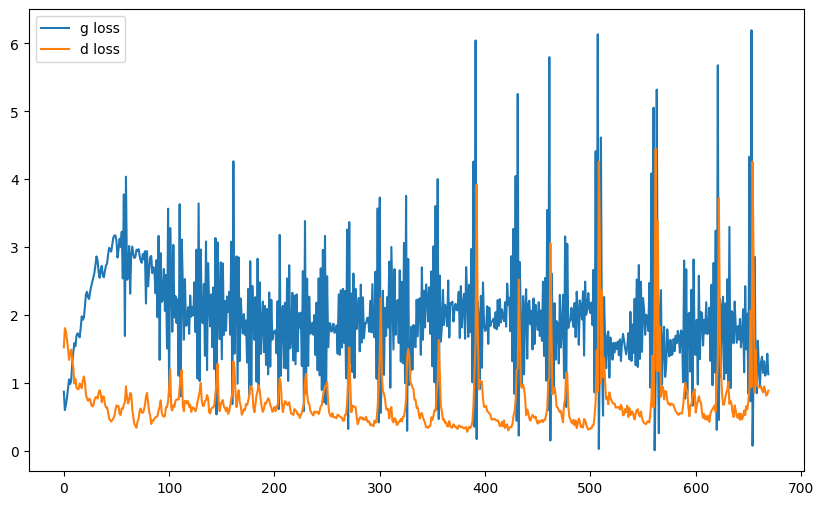

it: 869; g_loss: 1.0838501453399658; d_loss: 0.6397358775138855; avg_real_score: 0.6480702757835388; avg_fake_score: 0.16057519614696503: : 399it [00:28, 13.23it/s]

generated images


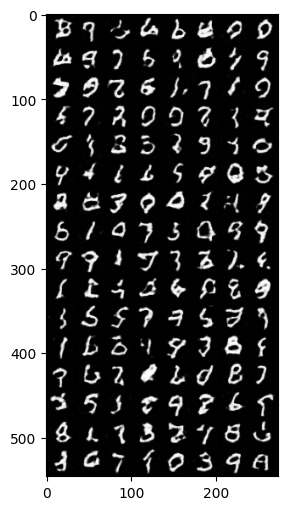

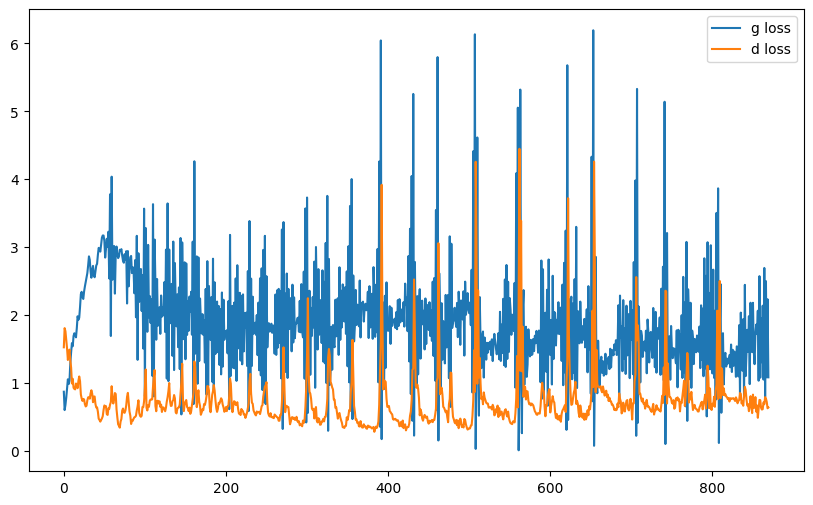

it: 937; g_loss: 1.4259459972381592; d_loss: 0.9470499753952026; avg_real_score: 0.45875465869903564; avg_fake_score: 0.08884499967098236: : 469it [00:33, 13.85it/s]
it: 938; g_loss: 2.7298431396484375; d_loss: 0.6029025316238403; avg_real_score: 0.8558311462402344; avg_fake_score: 0.33979499340057373: : 0it [00:00, ?it/s]

generated images


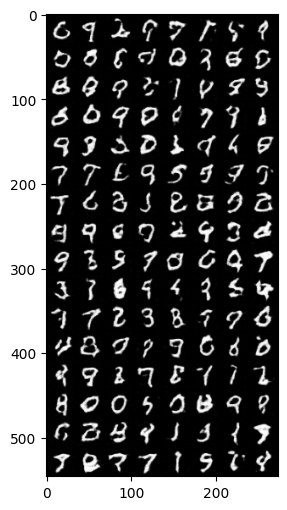

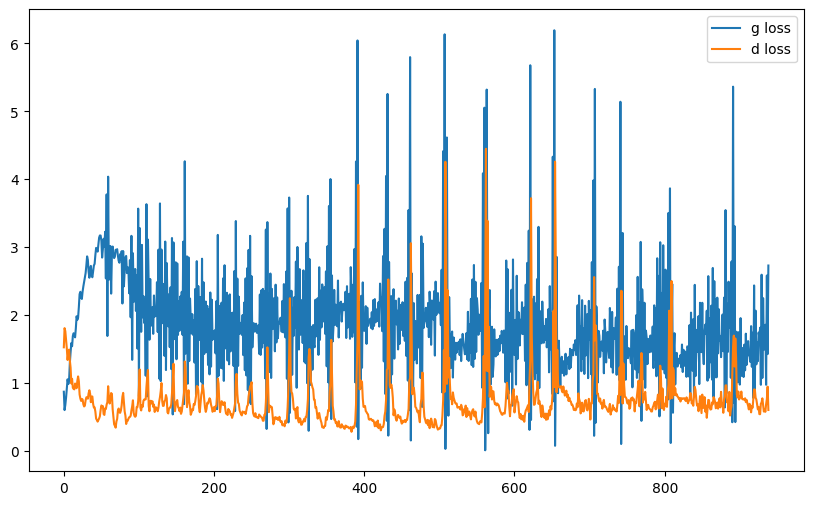

it: 1138; g_loss: 3.085171699523926; d_loss: 1.1598635911941528; avg_real_score: 0.9481947422027588; avg_fake_score: 0.647996187210083: : 199it [00:14, 14.59it/s]    

generated images


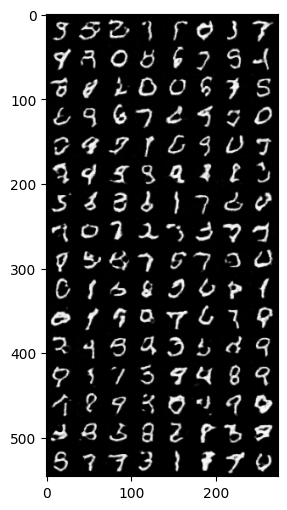

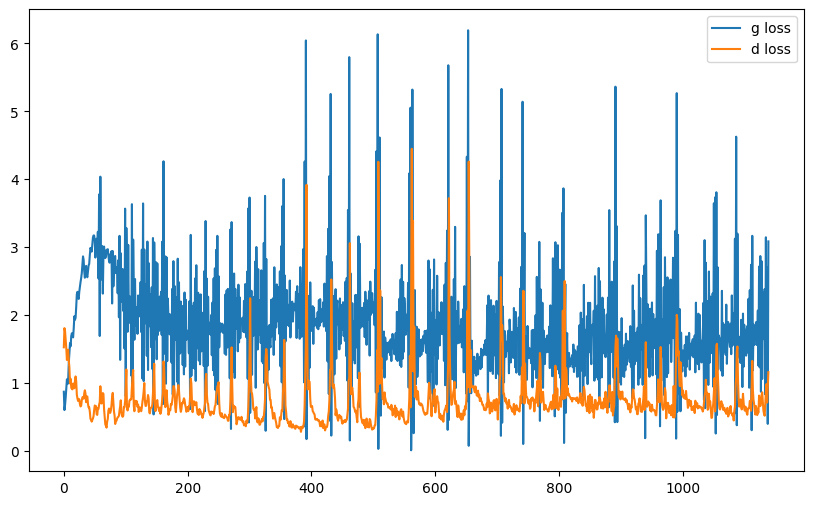

it: 1338; g_loss: 2.698370933532715; d_loss: 0.6329355835914612; avg_real_score: 0.8465613126754761; avg_fake_score: 0.3531779944896698: : 399it [00:29, 14.05it/s]  

generated images


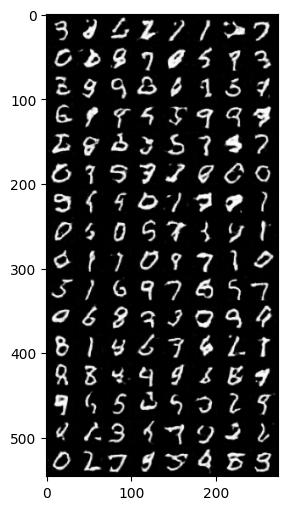

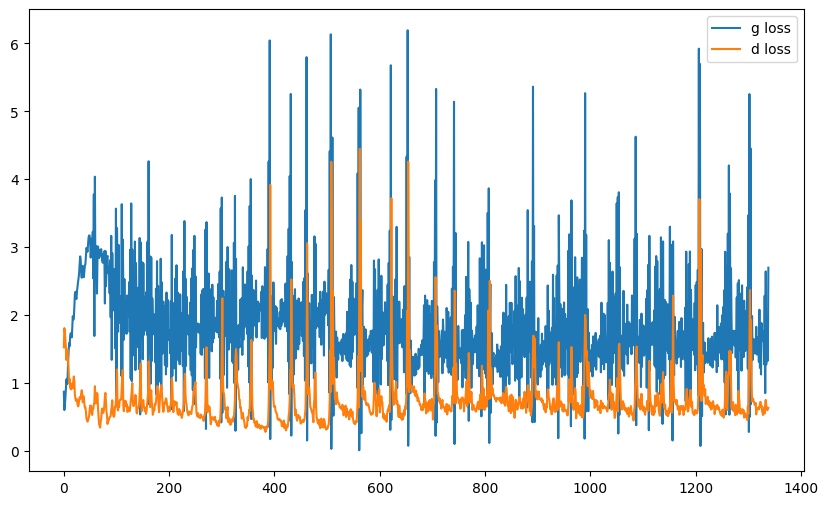

it: 1406; g_loss: 1.4913705587387085; d_loss: 0.6413877010345459; avg_real_score: 0.6085182428359985; avg_fake_score: 0.10708560794591904: : 469it [00:34, 13.41it/s]
it: 1407; g_loss: 1.4414117336273193; d_loss: 0.5885655283927917; avg_real_score: 0.7774423956871033; avg_fake_score: 0.2663320004940033: : 0it [00:00, ?it/s]

generated images


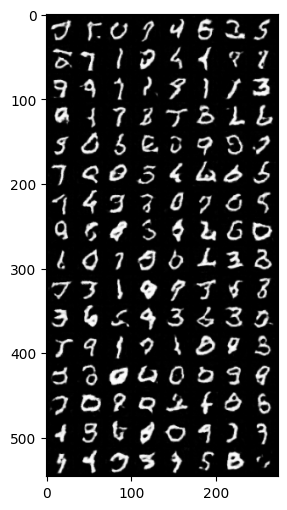

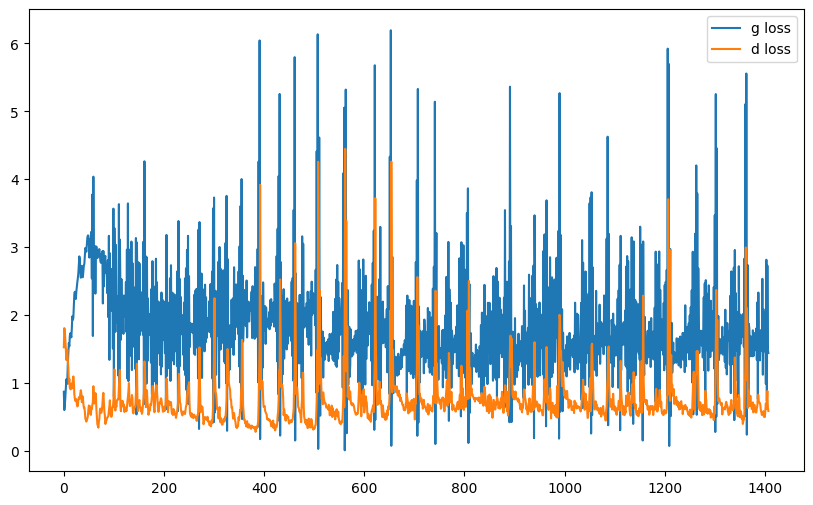

it: 1607; g_loss: 2.0143439769744873; d_loss: 0.6358172297477722; avg_real_score: 0.9003854990005493; avg_fake_score: 0.3907589316368103: : 199it [00:15, 12.84it/s]

generated images


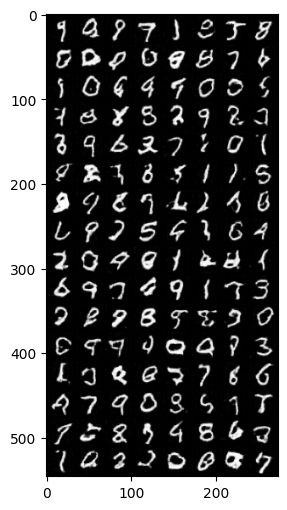

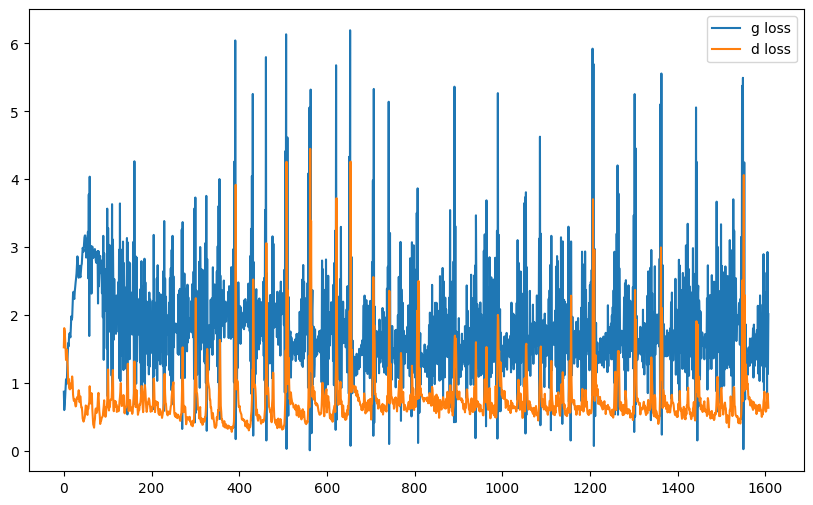

it: 1807; g_loss: 1.6865100860595703; d_loss: 0.8620606660842896; avg_real_score: 0.7010307312011719; avg_fake_score: 0.35355252027511597: : 400it [00:31, 11.44it/s]

generated images


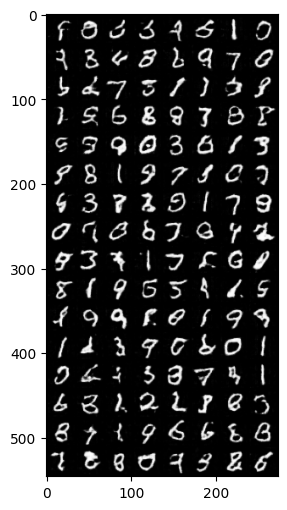

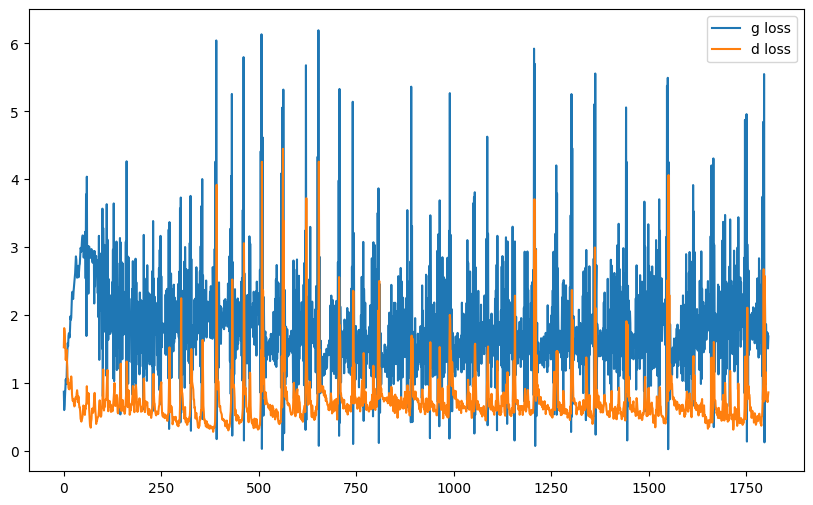

it: 1875; g_loss: 2.4715938568115234; d_loss: 0.4025232195854187; avg_real_score: 0.8892859220504761; avg_fake_score: 0.23604676127433777: : 469it [00:37, 12.48it/s]
it: 1876; g_loss: 2.2502236366271973; d_loss: 0.31652653217315674; avg_real_score: 0.8272210359573364; avg_fake_score: 0.1093047708272934: : 0it [00:00, ?it/s]

generated images


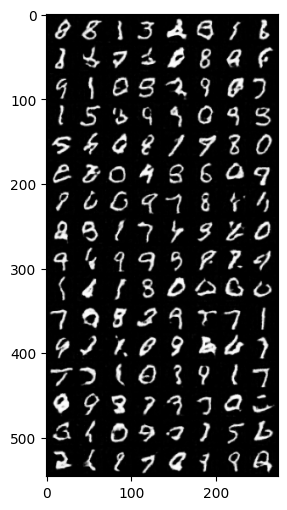

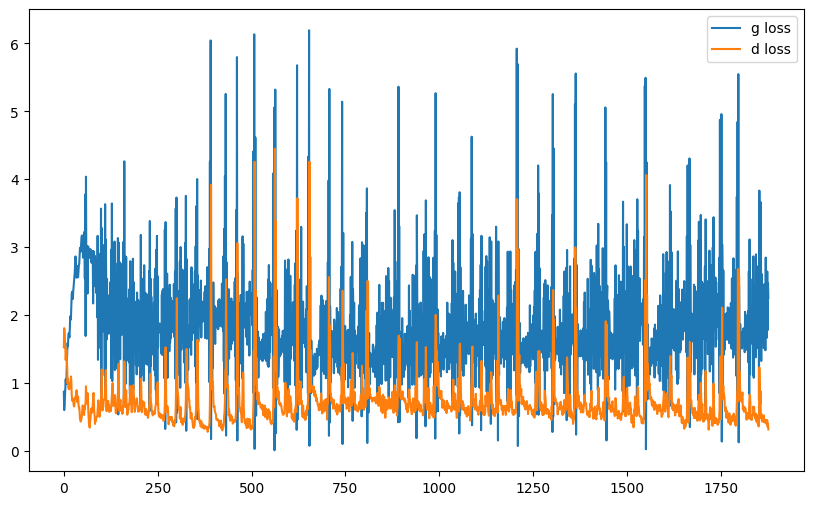

it: 2076; g_loss: 1.9275519847869873; d_loss: 0.5215175747871399; avg_real_score: 0.806800127029419; avg_fake_score: 0.24162445962429047: : 199it [00:15, 13.90it/s]

generated images


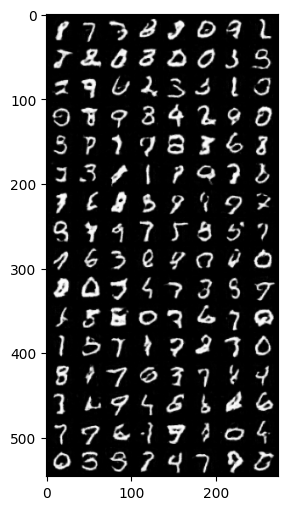

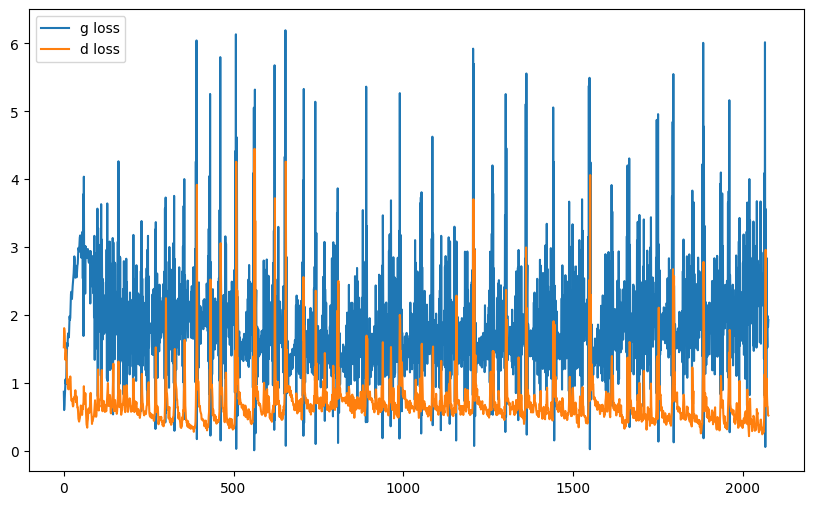

it: 2276; g_loss: 2.1152219772338867; d_loss: 0.3640514016151428; avg_real_score: 0.8228873610496521; avg_fake_score: 0.14119011163711548: : 399it [00:31, 11.22it/s]

generated images


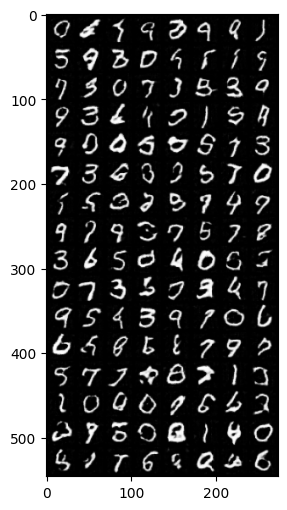

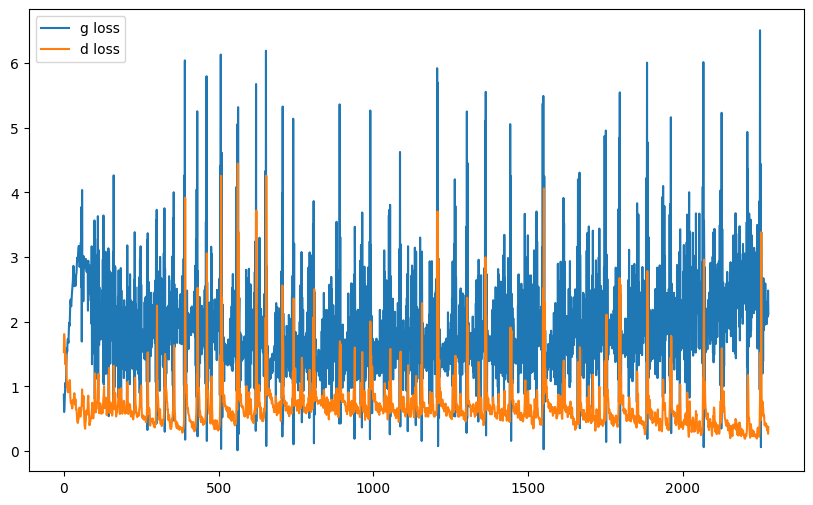

it: 2344; g_loss: 8.896020889282227; d_loss: 0.9756582379341125; avg_real_score: 0.9963297843933105; avg_fake_score: 0.5832099318504333: : 469it [00:37, 12.50it/s]


In [ ]:
nb_epochs = 5
g_losses = []
d_losses = []


j = 0


z_test = sample_z(64, nz) # we generate the noise only once for testing

for epoch in range(nb_epochs):

    # train
    pbar = tqdm(enumerate(dataloader))
    for i, batch in pbar:
        im, _ = batch # we don't care about the label for unconditional generation
        im = im.to(device)

        cur_batch_size = im.shape[0]

        # 1. sample a z vector
        z = sample_z(cur_batch_size,nz)
        # 2. Generate a fake image
        x = netG(z)
        # 3. Classify real image with D
        yhat_real = netD(im)
        # 4. Classify fake image with D
        yhat_fake = netD(x.detach())



        ###
        ### Discriminator
        ###
        label_real = get_labels_one(cur_batch_size)
        label_fake0 = get_labels_zero(cur_batch_size)
        d_loss = criterion(yhat_real,label_real) + criterion(yhat_fake, label_fake0)
        d_opt.zero_grad()
        d_loss.backward() # we need to retain graph=True to be able to calculate the gradient in the g backprop
        d_opt.step()


        ###
        ### Generator
        ###

        label_fake1 = get_labels_one(cur_batch_size)
        g_loss = criterion(netD(x), label_fake1)
        g_opt.zero_grad()
        g_loss.backward()
        g_opt.step()


        # Save Metrics

        d_losses.append(d_loss.item())
        g_losses.append(g_loss.item())

        avg_real_score = yhat_real.mean().item()
        avg_fake_score = yhat_fake.mean().item()



        pbar.set_description(f"it: {j}; g_loss: {g_loss}; d_loss: {d_loss}; avg_real_score: {avg_real_score}; avg_fake_score: {avg_fake_score}")
        if i % display_freq == 0:

            #fake_im = netG(z_test)

            un_norm = renorm(x) # for visualization

            grid = torchvision.utils.make_grid(un_norm, nrow=8)
            pil_grid = to_pil(grid)

            print("generated images")
            plt.imshow(pil_grid)
            plt.show()

            plt.plot(range(len(g_losses)), g_losses, label='g loss')
            plt.plot(range(len(g_losses)), d_losses, label='d loss')

            plt.legend()
            plt.show()

        j += 1

## Test

### Interpolation

generated images


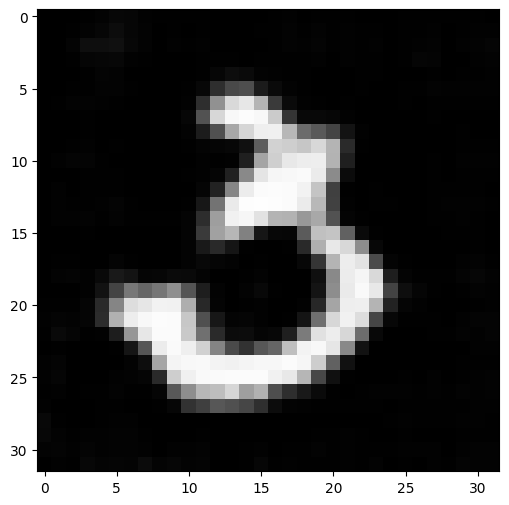

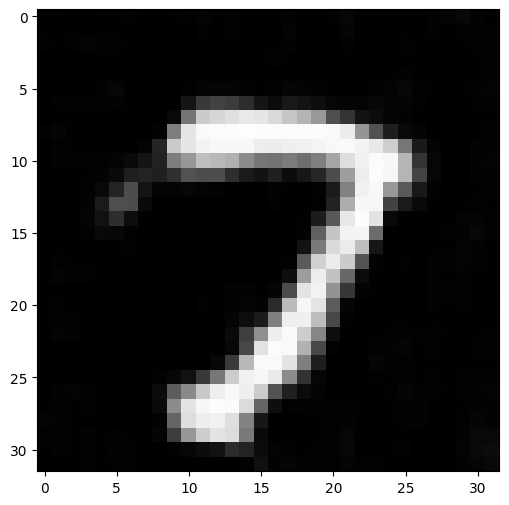

In [ ]:
z1 = sample_z(1, nz)
z2 = sample_z(1, nz)
x1 = netG(z1)
x2 = netG(z2)
un_norm1 = renorm(x1) # for visualization
un_norm2 = renorm(x2)
grid1 = torchvision.utils.make_grid(un_norm1, nrow=8)
grid2 = torchvision.utils.make_grid(un_norm2, nrow=8)
pil_grid1 = to_pil(grid1)
pil_grid2 = to_pil(grid2)

print("generated images")
plt.imshow(pil_grid1)
plt.show()
plt.imshow(pil_grid2)
plt.show()


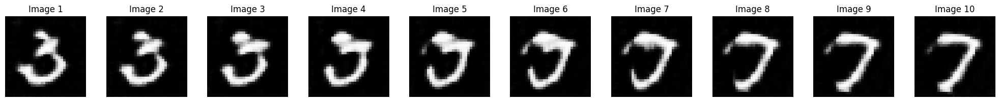

In [ ]:

def interpolate(z1, z2, steps=10):
    return [z1 * (1 - alpha) + z2 * alpha for alpha in np.linspace(0, 1, steps)]


# Interpolate between z1 and z2
interpolated_z = interpolate(z1, z2)

# Create a figure for the interpolated images
plt.figure(figsize=(20, 2)) # Adjust the figure size as needed

for i, z in enumerate(interpolated_z):
    x = netG(z)
    un_norm = renorm(x)  # Normalize for visualization
    grid = torchvision.utils.make_grid(un_norm, nrow=8)
    pil_grid = to_pil(grid)

    # Create a subplot for each image
    ax = plt.subplot(1, len(interpolated_z), i + 1)
    ax.imshow(pil_grid)
    ax.set_title(f"Image {i+1}")
    ax.axis('off')

plt.tight_layout()
plt.show()


### Tests

In [ ]:
batch_size = 128 # Images per batch

# Resize to 32x32 for easier upsampling/downsampling
mytransform = transforms.Compose([transforms.Resize(32),
                                  transforms.ToTensor(),
                                  transforms.Grayscale(),
                                 transforms.Normalize((.5), (.5))]) # normalize between [-1, 1] with tanh activation

cifar10_train = torchvision.datasets.CIFAR10(root='.', download=True, transform=mytransform)

Files already downloaded and verified


In [ ]:
dataloader = DataLoader(dataset=cifar10_train,
                         batch_size=batch_size,
                         shuffle=True)

In [ ]:
# plot some images
real_batch, real_labels = next(iter(dataloader))

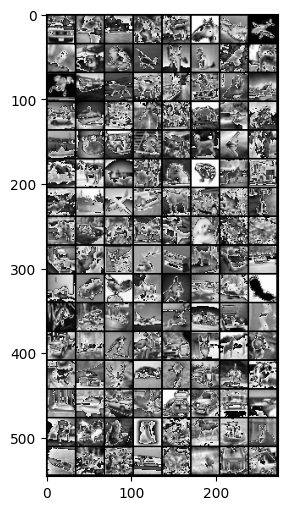

In [ ]:
plt.imshow(transforms.ToPILImage()(make_grid(real_batch)))

In [ ]:
nz = 100
ngf = 32
ndf = 32

nchannels= 1
lr_d = 0.0002
lr_g = 0.0005
beta1= 0.5
display_freq = 200

netD = Discriminator(ndf, nchannels).to(device)
netG = Generator(nz, ngf).to(device)

netD.apply(weights_init)
netG.apply(weights_init)

g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))

In [ ]:
nb_epochs = 20
g_losses = []
d_losses = []


j = 0


z_test = sample_z(64, nz) # we generate the noise only once for testing

for epoch in range(nb_epochs):

    # train
    pbar = tqdm(enumerate(dataloader))
    for i, batch in pbar:
        im, _ = batch # we don't care about the label for unconditional generation
        im = im.to(device)

        cur_batch_size = im.shape[0]

        # 1. sample a z vector
        z = sample_z(cur_batch_size,nz)
        # 2. Generate a fake image
        x = netG(z)
        # 3. Classify real image with D
        yhat_real = netD(im)
        # 4. Classify fake image with D
        yhat_fake = netD(x.detach())



        ###
        ### Discriminator
        ###
        label_real = get_labels_one(cur_batch_size)
        label_fake0 = get_labels_zero(cur_batch_size)
        d_loss = criterion(yhat_real,label_real) + criterion(yhat_fake, label_fake0)
        d_opt.zero_grad()
        d_loss.backward() # we need to retain graph=True to be able to calculate the gradient in the g backprop
        d_opt.step()


        ###
        ### Generator
        ###

        label_fake1 = get_labels_one(cur_batch_size)
        g_loss = criterion(netD(x), label_fake1)
        g_opt.zero_grad()
        g_loss.backward()
        g_opt.step()


        # Save Metrics

        d_losses.append(d_loss.item())
        g_losses.append(g_loss.item())

        avg_real_score = yhat_real.mean().item()
        avg_fake_score = yhat_fake.mean().item()



        pbar.set_description(f"it: {j}; g_loss: {g_loss}; d_loss: {d_loss}; avg_real_score: {avg_real_score}; avg_fake_score: {avg_fake_score}")
        if i % display_freq == 0:

            #fake_im = netG(z_test)

            un_norm = renorm(x) # for visualization

            grid = torchvision.utils.make_grid(un_norm, nrow=8)
            pil_grid = to_pil(grid)

            print("generated images")
            plt.imshow(pil_grid)
            plt.show()

            plt.plot(range(len(g_losses)), g_losses, label='g loss')
            plt.plot(range(len(g_losses)), d_losses, label='d loss')

            plt.legend()
            plt.show()

        j += 1

# 4. Conditional GANs [BONUS]

A simple way to improve training performance and obtain control of the generation is to provide extra information into the Generator and the Discriminator, known as **Conditional GANs**. In this case, we will provide the class label (digit number of MNIST) into both the generator and the discriminator. This will help both of the networks.

## 4.1 Conditional Generator and Discriminator

Complete the ConditionalDiscriminator and ConditionalGenerator classes using your GAN building blocks (`get_upsampling_block` and `get_downsampling_block` functions).


### 4.1.1 Generator

In [ ]:
# GENERATOR

'''
The conditional generator needs the label information as well as the latent vector. We will combine the latent vector and the class information in the following way:

- The class information for the generator will be represented as a one-hot vector sized `[batch_size, 10]` (since there are 10 classes in MNIST)
- The latent vector for the generator will still be sized `[batch_size, nz]`

1. Transform both of these modalities into 'images' (by adding dimensions)
2. Like before, apply the first upscaling block to both of these 'images'. We will now have 2 separate blocks sized

'''

class ConditionalGenerator(nn.Module):
    def __init__(self, nz, nc, ngf, nchannels=1):
        super().__init__()
        self.upscaling_z = get_upscaling_block(nz, ngf*8, 4, 1, 0)
        self.upscaling_c = get_upscaling_block(nc, ngf*8, 4, 1, 0)

        self.rest_model = nn.Sequential(
            get_upscaling_block(ngf*16, ngf * 8, 4, 2, 1),
            get_upscaling_block(ngf * 8, ngf * 4, 4, 2, 1),
            get_upscaling_block(ngf * 4, nchannels, 4, 2, 1, last_layer=True)
        )

    def forward(self, x, y):
        x = x.unsqueeze(2).unsqueeze(2)
        x = self.upscaling_z(x)

        y = y.unsqueeze(2).unsqueeze(2)
        y = self.upscaling_c(y)

        x = torch.cat((x,y), dim=1)
        return self.rest_model(x)

### 4.1.2 Discriminator

In [ ]:
# Discriminator

'''
The conditional discriminator needs the label information as well as the latent vector. We will combine the latent vector and the class information in the following way:

- The class information for the discriminator will be represented as a one-hot vector sized `[batch_size, 10]` (since there are 10 classes in MNIST)
- The latent vector for the generator will still be sized `[batch_size, nz]`

1. Transform both of these modalities into 'images' (by adding dimensions)
2. Like before, apply the first upscaling block to both of these 'images'. We will now have 2 separate blocks sized

'''

class ConditionalDiscriminator(nn.Module):
    def __init__(self, ndf, nc, nchannels=1):
        super().__init__()
        self.downscale_x = get_downscaling_block(nchannels, ndf*2, 4, 2, 1, use_batch_norm=False)
        self.downscale_y = get_downscaling_block(nc, ndf*2, 4, 2, 1, use_batch_norm=False)

        self.rest = nn.Sequential(
                                  get_downscaling_block(ndf*4,ngf*8,(4,4), 2, 1),
                                  get_downscaling_block(ngf*8,ngf*16,(4,4), 2, 1),
                                  get_downscaling_block(ngf*16,nchannels,(4,4), 1, 0, is_last=True)
        )

        #                 #
        ###################

    def forward(self, x, y):

        y = y.unsqueeze(2).unsqueeze(2)  # Now y has size [B, 10, 1, 1]
        y = y.expand(-1, -1, 32, 32)  # Expanding to the desired size

        x=self.downscale_x (x)
        y=self.downscale_y (y)

        print(y.shape,x.shape)

        x = torch.cat((x,y),dim=1)


        return self.rest(x).squeeze(1).squeeze(1) # remove spatial dimensions

### 4.1.3 Sanity Checks

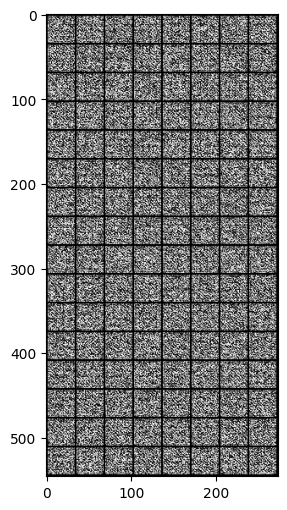

In [ ]:
# CONDITIONAL GENERATOR SANITY CHECKING

z = torch.randn(batch_size, nz)
y = F.one_hot(real_labels).float()

cG = ConditionalGenerator(nz=nz, ngf=16, nc=10)
x_fake = cG(z, y)
plt.imshow(transforms.ToPILImage()(make_grid(x_fake, nrow=8)))

In [ ]:
# Conditional Discriminator Sanity Checking
cD = ConditionalDiscriminator(ndf=32, nc=10, nchannels=1)
assert cD(real_batch, F.one_hot(real_labels).float()).shape == (real_batch.shape[0], 1)

## 4.2 Training

In [ ]:
nz = 100
ndf = 32
ngf = 32
nchannels= 1
lr_d = 0.0002
lr_g = 0.0005
beta1= 0.5
display_freq = 200

nc= 10

netD = ConditionalDiscriminator(ndf, nc, nchannels=1).to(device)
netG = ConditionalGenerator(nz, nc, ngf).to(device)

netG.apply(weights_init)
netD.apply(weights_init)

g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))



it: 0; g_loss: 0.4718485474586487; d_loss: 2.4315834045410156; avg_real_score: 0.1428569257259369; avg_fake_score: 0.10444384068250656: : 0it [00:00, ?it/s]

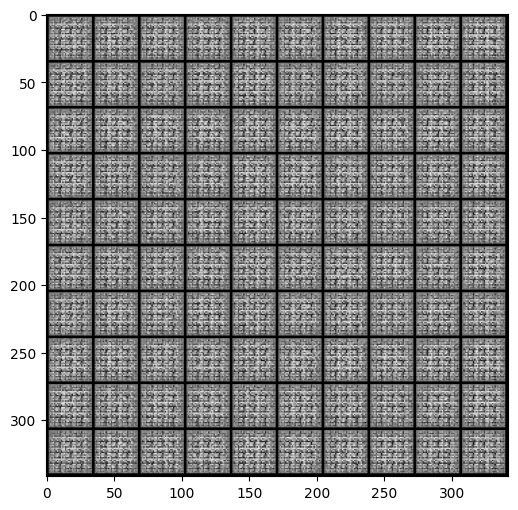

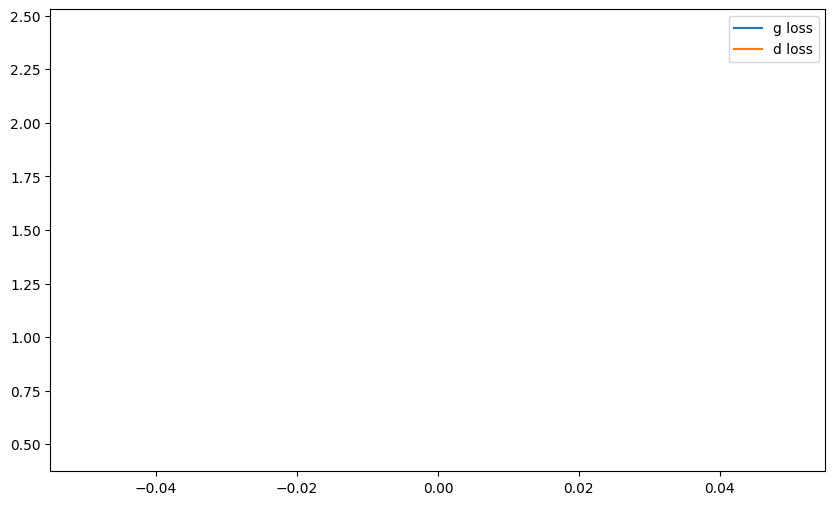

it: 200; g_loss: 2.120227813720703; d_loss: 1.522489309310913; avg_real_score: 0.6643261909484863; avg_fake_score: 0.6273854970932007: : 200it [00:31,  5.61it/s] 

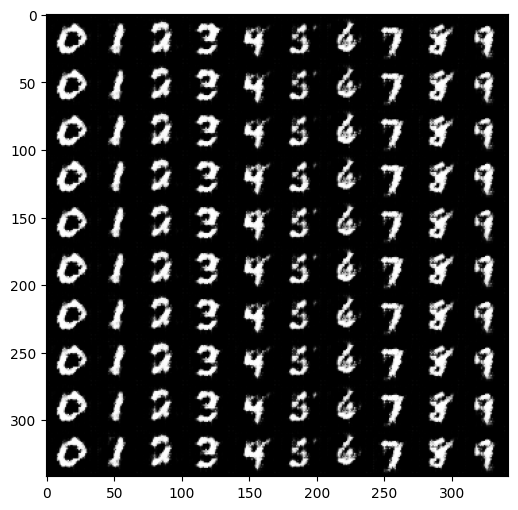

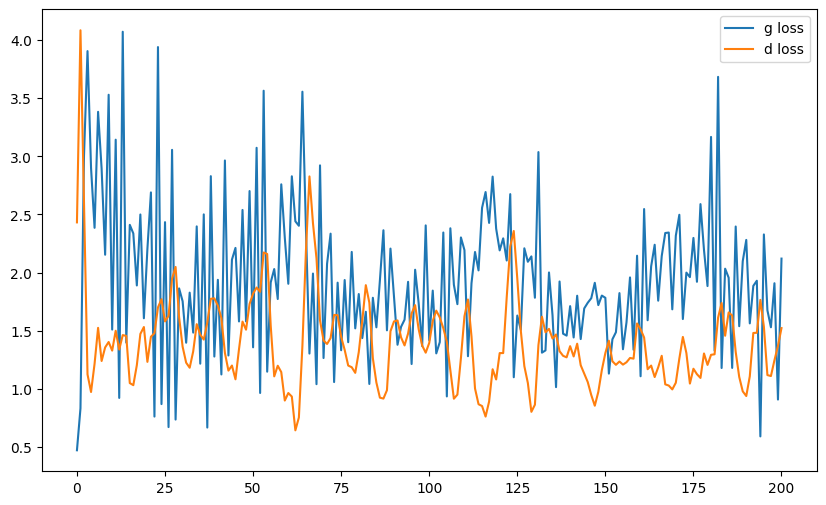

it: 400; g_loss: 2.6426308155059814; d_loss: 1.0415587425231934; avg_real_score: 0.7986962795257568; avg_fake_score: 0.48781633377075195: : 400it [01:01,  6.91it/s]

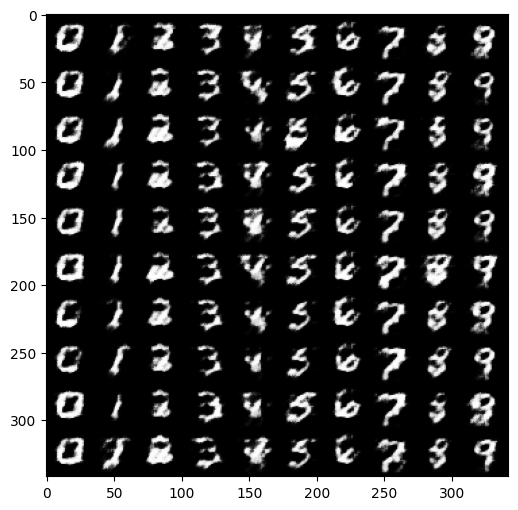

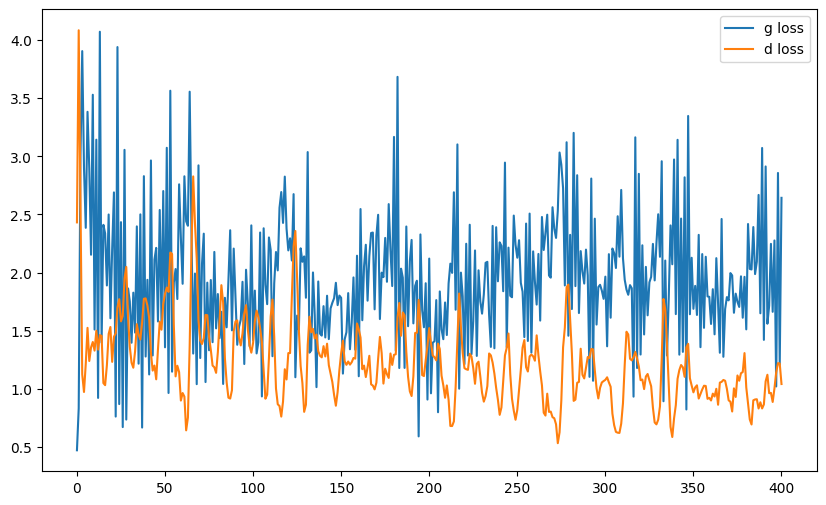

it: 468; g_loss: 2.681264638900757; d_loss: 0.999238133430481; avg_real_score: 0.756142795085907; avg_fake_score: 0.42400822043418884: : 469it [01:12,  6.46it/s]
it: 469; g_loss: 1.3687635660171509; d_loss: 1.1051020622253418; avg_real_score: 0.5456720590591431; avg_fake_score: 0.2044118046760559: : 0it [00:00, ?it/s]

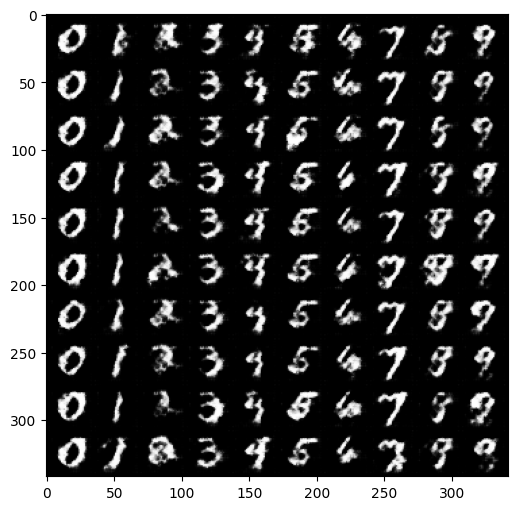

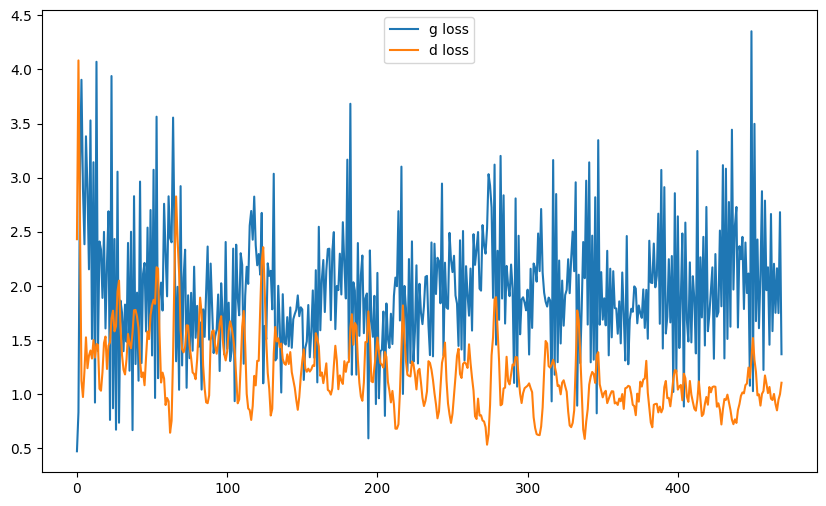

it: 669; g_loss: 0.8518567085266113; d_loss: 1.1423510313034058; avg_real_score: 0.502475380897522; avg_fake_score: 0.25929856300354004: : 200it [00:30,  6.84it/s] 

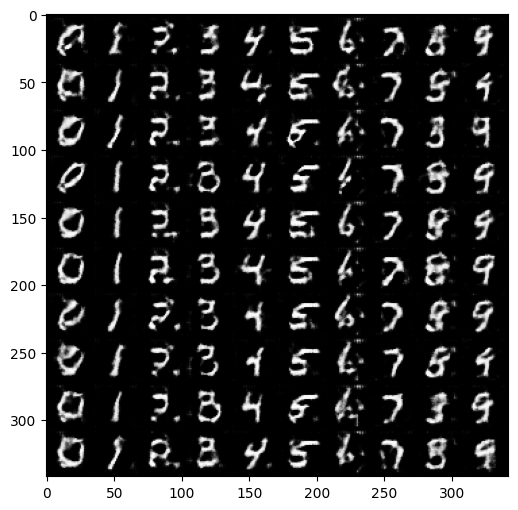

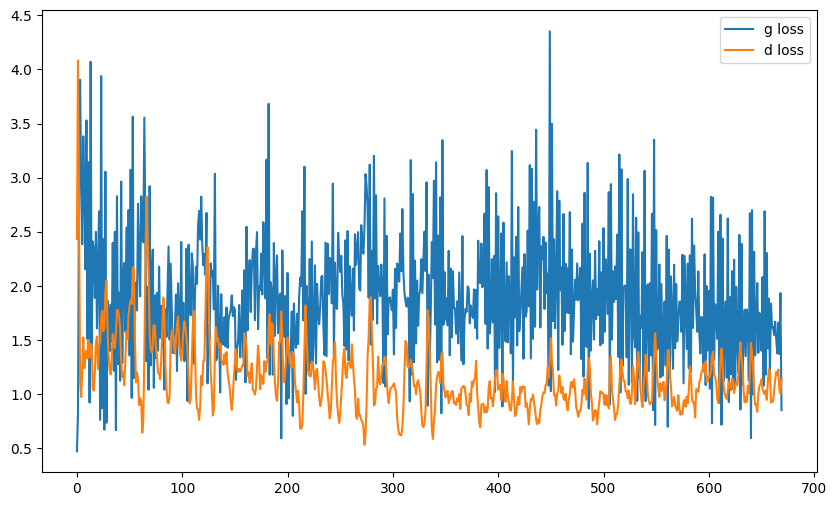

it: 869; g_loss: 1.823197603225708; d_loss: 1.2061495780944824; avg_real_score: 0.7130992412567139; avg_fake_score: 0.540772557258606: : 400it [01:00,  6.43it/s]   

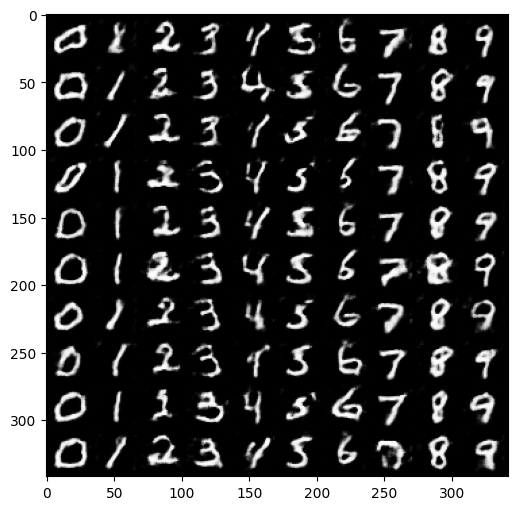

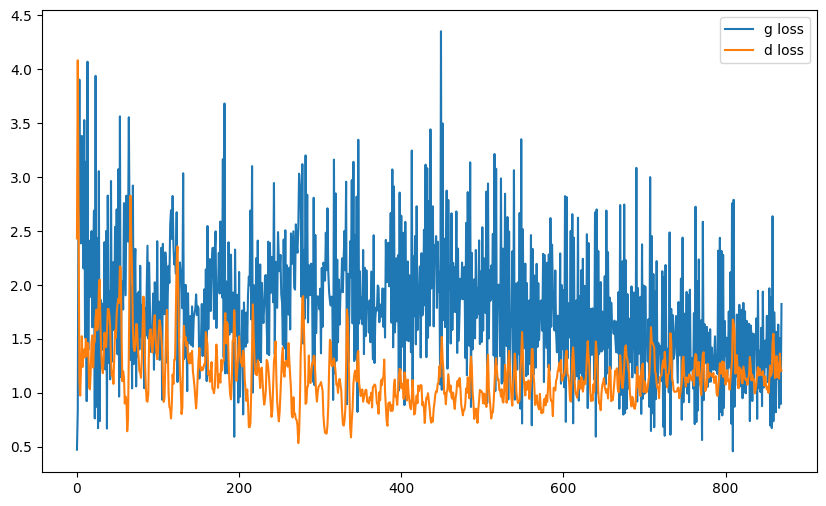

it: 937; g_loss: 1.1646933555603027; d_loss: 1.2187097072601318; avg_real_score: 0.5441232919692993; avg_fake_score: 0.40172863006591797: : 469it [01:11,  6.56it/s]
it: 938; g_loss: 1.2175610065460205; d_loss: 1.2357680797576904; avg_real_score: 0.5712523460388184; avg_fake_score: 0.4357564449310303: : 0it [00:00, ?it/s]

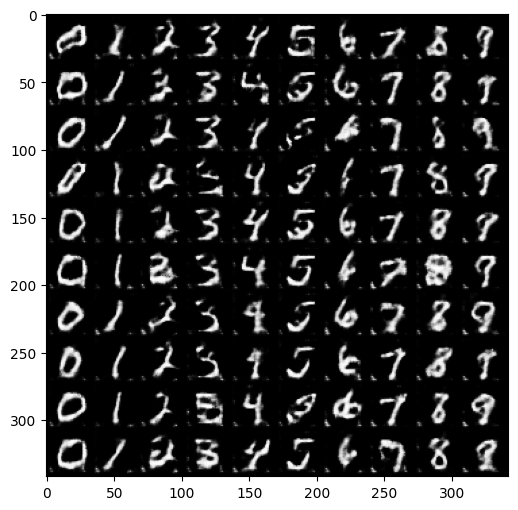

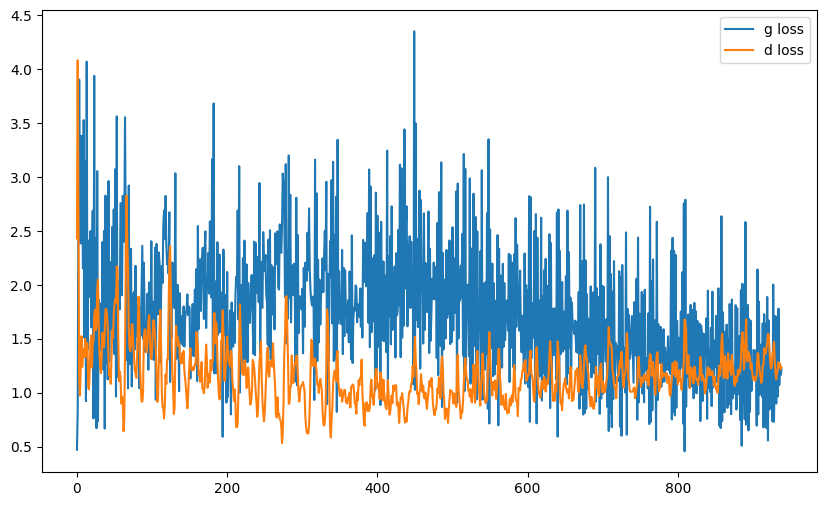

it: 1138; g_loss: 1.315051794052124; d_loss: 1.1473867893218994; avg_real_score: 0.6103389263153076; avg_fake_score: 0.4347435235977173: : 200it [00:30,  6.87it/s] 

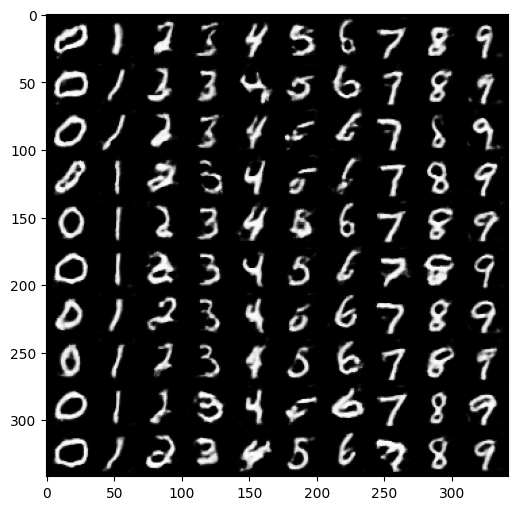

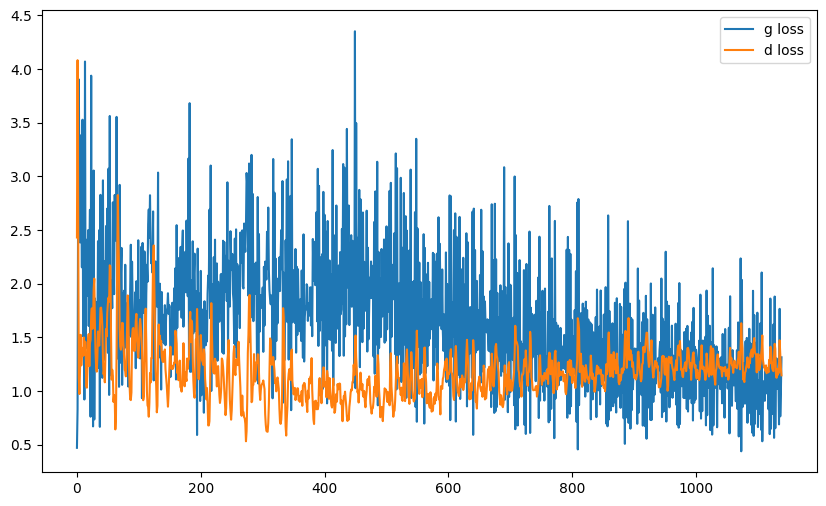

it: 1338; g_loss: 1.4077999591827393; d_loss: 1.1720044612884521; avg_real_score: 0.6368914842605591; avg_fake_score: 0.4877947270870209: : 400it [01:00,  6.82it/s] 

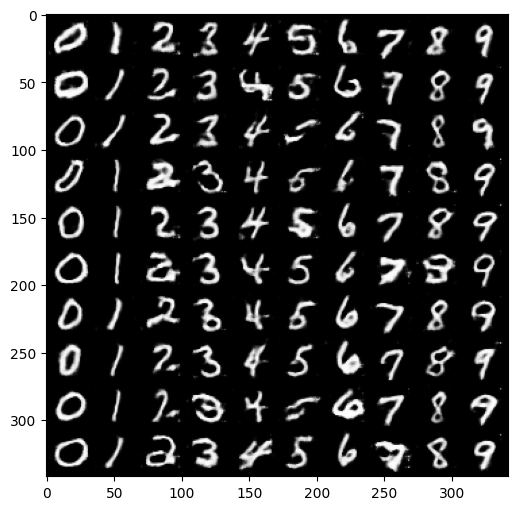

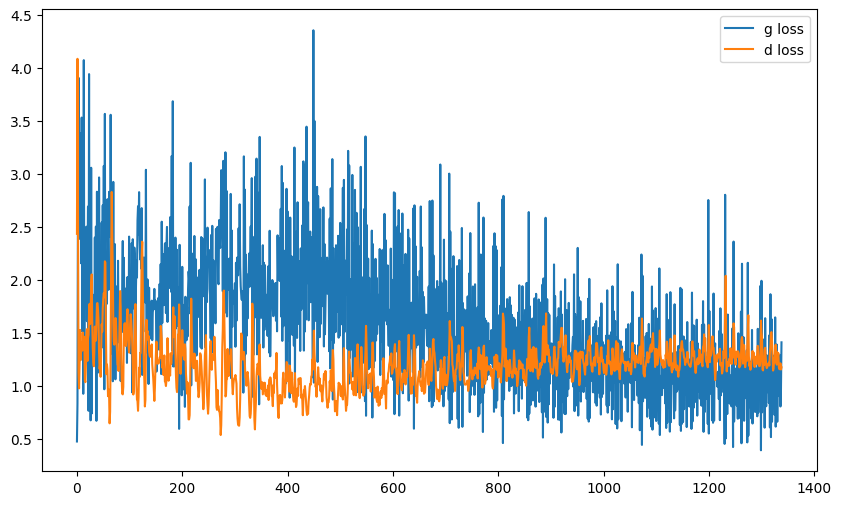

it: 1406; g_loss: 0.9163675308227539; d_loss: 1.2206023931503296; avg_real_score: 0.5287148356437683; avg_fake_score: 0.3854290843009949: : 469it [01:11,  6.53it/s]
it: 1407; g_loss: 1.0594935417175293; d_loss: 1.2032816410064697; avg_real_score: 0.5931150913238525; avg_fake_score: 0.45990127325057983: : 0it [00:00, ?it/s]

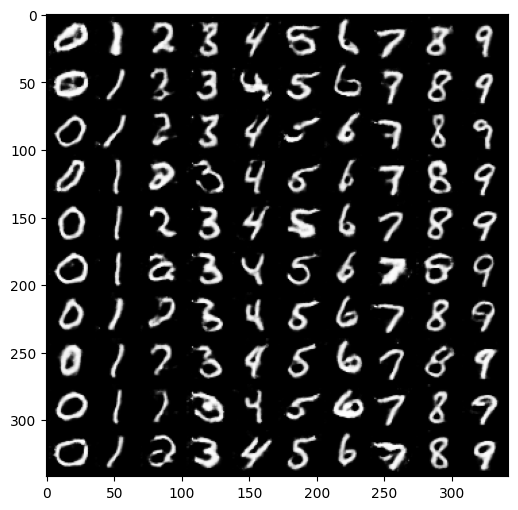

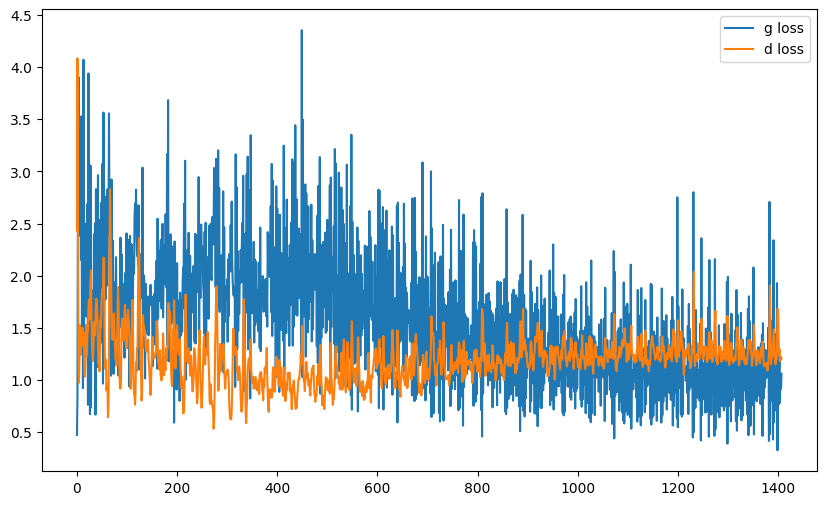

it: 1607; g_loss: 1.4860998392105103; d_loss: 1.1863908767700195; avg_real_score: 0.6366352438926697; avg_fake_score: 0.49497467279434204: : 200it [00:32,  6.82it/s]

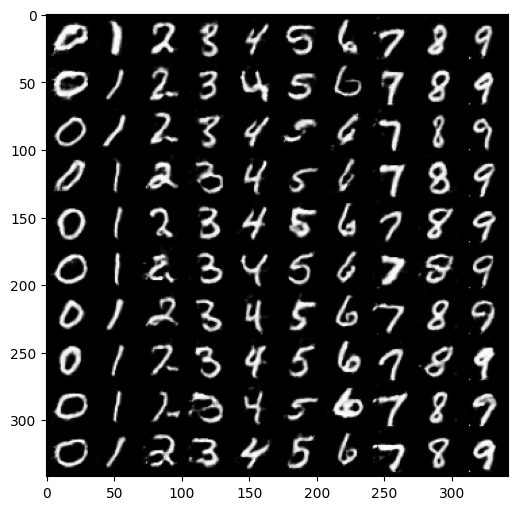

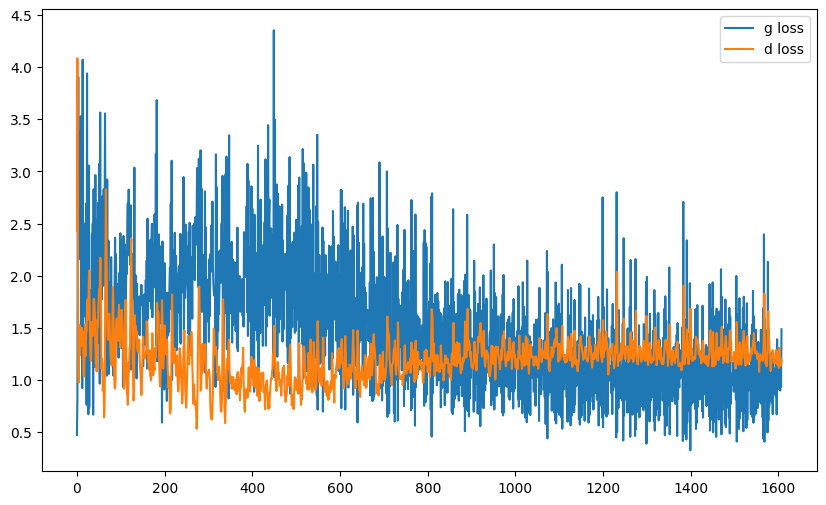

it: 1807; g_loss: 0.5410261154174805; d_loss: 1.256822109222412; avg_real_score: 0.39486461877822876; avg_fake_score: 0.23760339617729187: : 400it [01:02,  6.92it/s]

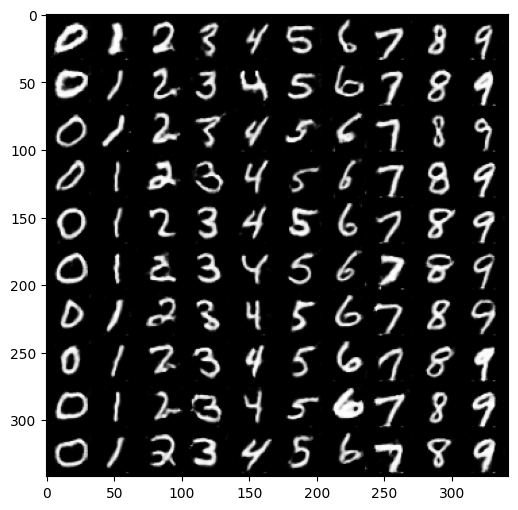

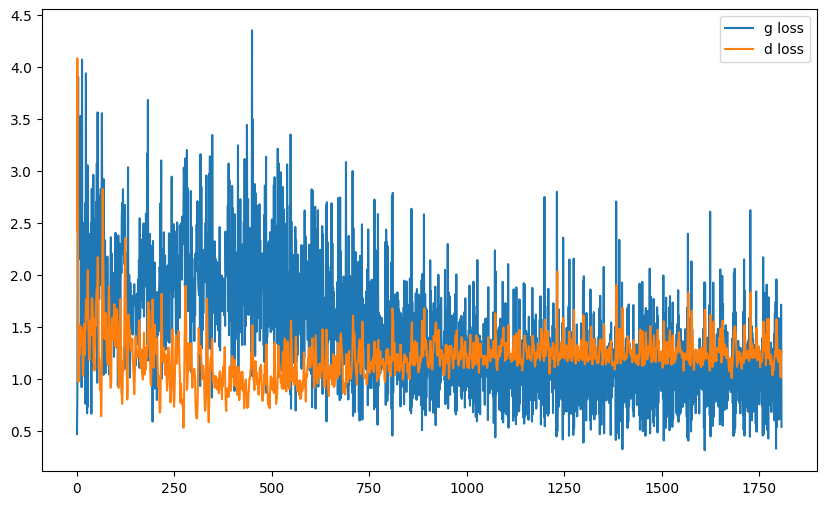

it: 1875; g_loss: 1.103251338005066; d_loss: 1.139318823814392; avg_real_score: 0.6714657545089722; avg_fake_score: 0.4967455565929413: : 469it [01:13,  6.39it/s]
it: 1876; g_loss: 0.8655714392662048; d_loss: 1.1767632961273193; avg_real_score: 0.5271192789077759; avg_fake_score: 0.3670702576637268: : 0it [00:00, ?it/s]

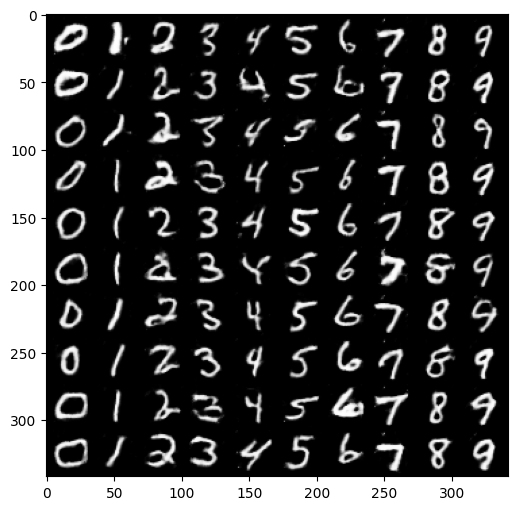

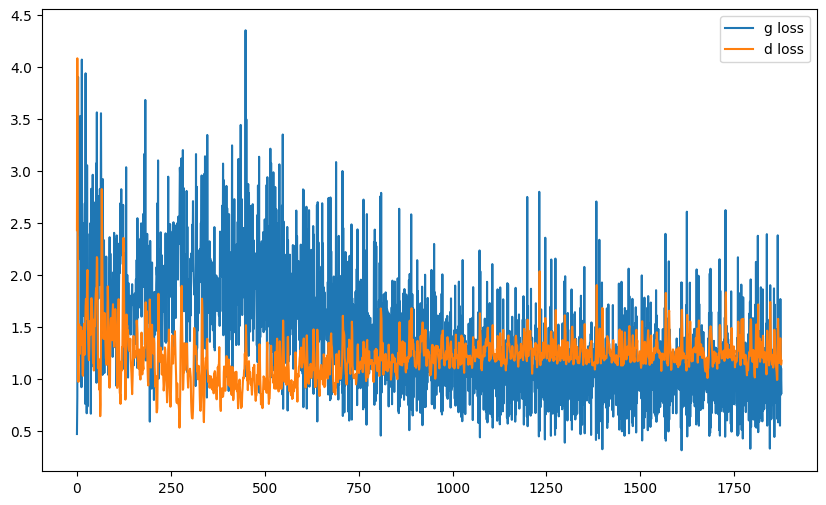

it: 2076; g_loss: 0.5149178504943848; d_loss: 1.3670082092285156; avg_real_score: 0.35369229316711426; avg_fake_score: 0.20443019270896912: : 200it [00:31,  6.01it/s]

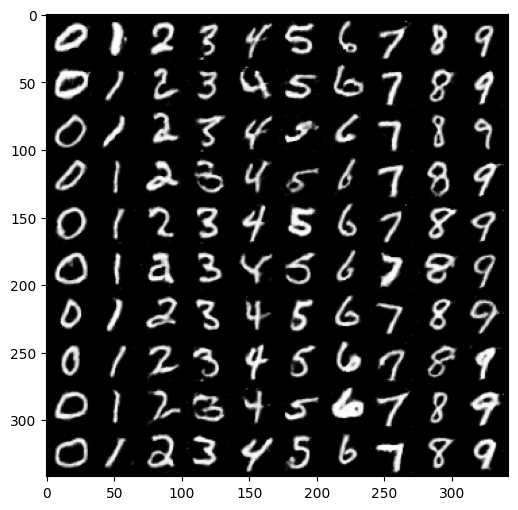

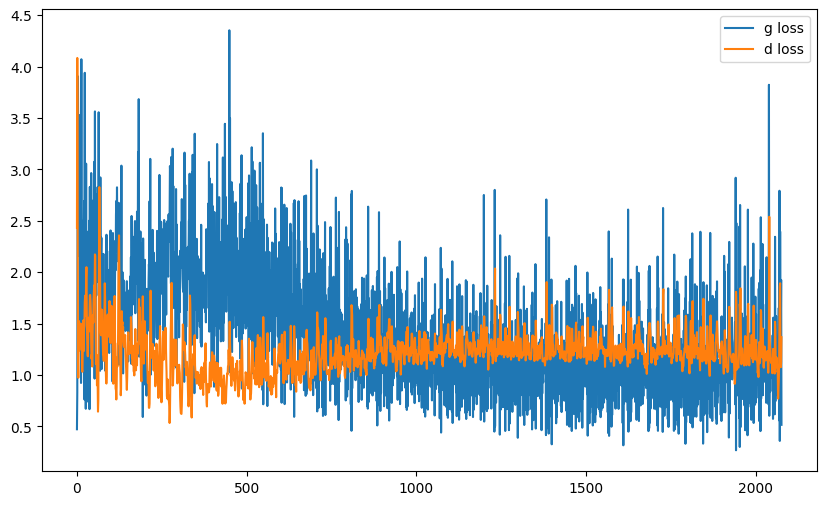

it: 2276; g_loss: 0.8231230974197388; d_loss: 1.3408763408660889; avg_real_score: 0.34494319558143616; avg_fake_score: 0.1811620146036148: : 400it [01:02,  6.47it/s]

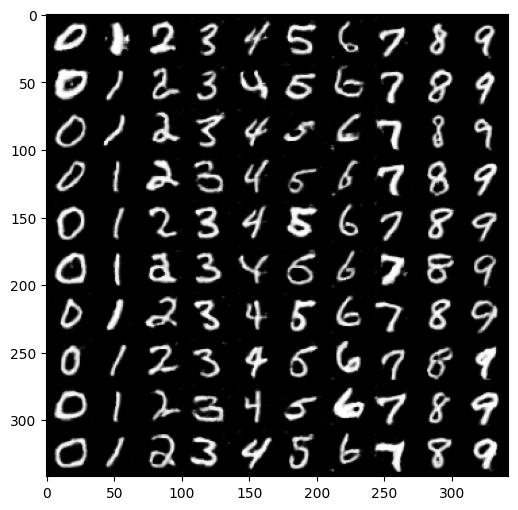

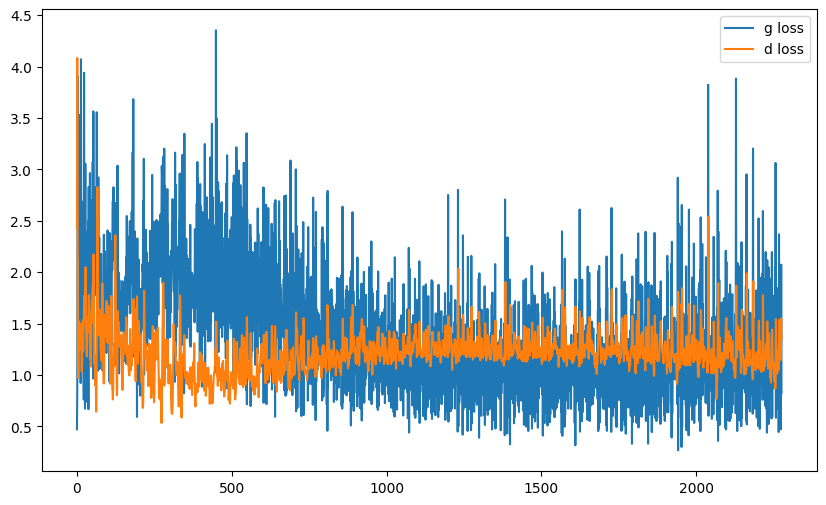

it: 2344; g_loss: 1.1742925643920898; d_loss: 1.0264344215393066; avg_real_score: 0.5674676299095154; avg_fake_score: 0.33443936705589294: : 469it [01:12,  6.43it/s]


In [ ]:
nb_epochs = 5

g_losses = []
d_losses = []

j = 0

z_test = sample_z(100, nz)  # we generate the noise only once for testing


for epoch in range(nb_epochs):

    pbar = tqdm(enumerate(dataloader))
    for i, batch in pbar:
        im, labels = batch
        im = im.to(device)

        y = F.one_hot(labels).float().to(device)

        cur_batch_size = im.shape[0]
        # 1. sample a z vector
        x = sample_z(cur_batch_size, nz)

        # 2. Generate a fake image
        x = netG(x, y)

        # 3. Classify real image with D
        yhat_real = netD(im, y)
        loss_D_real = criterion(yhat_real, get_labels_one(cur_batch_size))

        # 4. Classify fake image with D
        yhat_fake = netD(x, y)
        loss_D_fake = criterion(yhat_fake, get_labels_zero(cur_batch_size))


        ###
        ### Discriminator
        ###
        d_loss = loss_D_real + loss_D_fake
        d_opt.zero_grad()
        d_loss.backward(retain_graph=True) # we need to retain graph=True to be able to calculate the gradient in the g backprop
        d_opt.step()


        ###
        ### Generator
        ###
        g_loss = criterion(netD(x, y), get_labels_one(cur_batch_size))
        g_opt.zero_grad()
        g_loss.backward()
        g_opt.step()


        # Save Metrics

        d_losses.append(d_loss.item())
        g_losses.append(g_loss.item())

        avg_real_score = yhat_real.mean().item()
        avg_fake_score = yhat_fake.mean().item()

        pbar.set_description(f"it: {j}; g_loss: {g_loss}; d_loss: {d_loss}; avg_real_score: {avg_real_score}; avg_fake_score: {avg_fake_score}")

        if i % display_freq == 0:
            labels = torch.arange(0, 10).expand(size=(10, 10)).flatten().to(device)
            y = F.one_hot(labels).float().to(device)
            fake_im = netG(z_test, y)

            un_norm = renorm(fake_im) # for visualization

            grid = torchvision.utils.make_grid(un_norm, nrow=10)
            pil_grid = to_pil(grid)

            plt.imshow(pil_grid)
            plt.show()


            plt.plot(range(len(g_losses)), g_losses, label='g loss')
            plt.plot(range(len(g_losses)), d_losses, label='d loss')

            plt.legend()
            plt.show()

        j += 1

## 4.2 Testing
Visualization of the impact of z on generation. All digits in the same column have the same noise vector z.

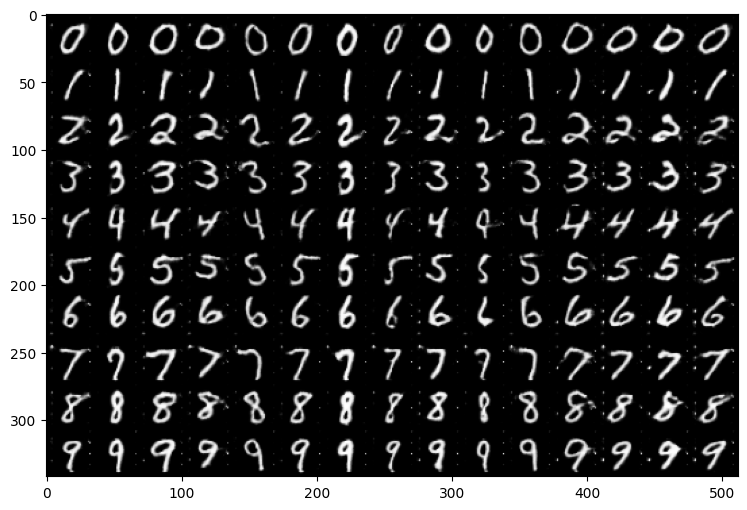

In [ ]:
n_ex = 15
n_classes = 10

z = sample_z(n_ex, nz).repeat(n_classes, 1) #.expand(10, nz)

netG.eval()

labels = torch.arange(n_classes).unsqueeze(0).reshape(-1, 1).repeat(1, n_ex).flatten().to(device)

ys = F.one_hot(labels).float()
fake_ims = netG(z, ys)

un_norm= renorm(fake_ims) # for visualization
grid = torchvision.utils.make_grid(un_norm, nrow=n_ex)
pil_grid = to_pil(grid)

plt.imshow(pil_grid)
plt.show()
